In [1]:
import os
import cv2
import matplotlib.pyplot as plt
import fft_analysis as ffta

%load_ext autoreload
%autoreload 2

# Lectura de archivos

In [2]:
def getPathfiles(string_path):
    list_files = os.listdir(string_path)
    
    list_pathfiles = []
    for i in list_files:
        filepath = string_path+'/'+i
        list_pathfiles.append(filepath)
    
    dictionary = dict()
    
    for i in range(len(list_files)):
        dictionary[list_files[i]] = list_pathfiles[i]
    
    return dictionary

def getImagesFromPathfile(list_pathfile,mode=cv2.IMREAD_GRAYSCALE):
    list_imgs = []
    for i in range(len(list_pathfile)):
        img = cv2.imread(list_pathfile[i],mode)
        list_imgs.append(img)
        
    return list_imgs

In [3]:
dict_folder_1 = getPathfiles("PAIByB-1")
dict_folder_2 = getPathfiles("PAIByB-2")

print(dict_folder_1)
print(dict_folder_2)

imgs_folder_1 = getImagesFromPathfile([*dict_folder_1.values()])
imgs_folder_2 = getImagesFromPathfile([*dict_folder_2.values()])

{'Noise-1.tif': 'PAIByB-1/Noise-1.tif', 'Noise-2.tif': 'PAIByB-1/Noise-2.tif', 'Noise-3.tif': 'PAIByB-1/Noise-3.tif', 'Noise-4.tif': 'PAIByB-1/Noise-4.tif', 'Noise.tif': 'PAIByB-1/Noise.tif'}
{'Pie2-1.tif': 'PAIByB-2/Pie2-1.tif', 'Pie2-2.tif': 'PAIByB-2/Pie2-2.tif', 'Pie2-3.tif': 'PAIByB-2/Pie2-3.tif', 'Pie2-4.tif': 'PAIByB-2/Pie2-4.tif', 'Pie2-5.tif': 'PAIByB-2/Pie2-5.tif'}


# 1.IV - Análisis espectral - FFT
## Imágenes pertenecientes a PAIByB-1

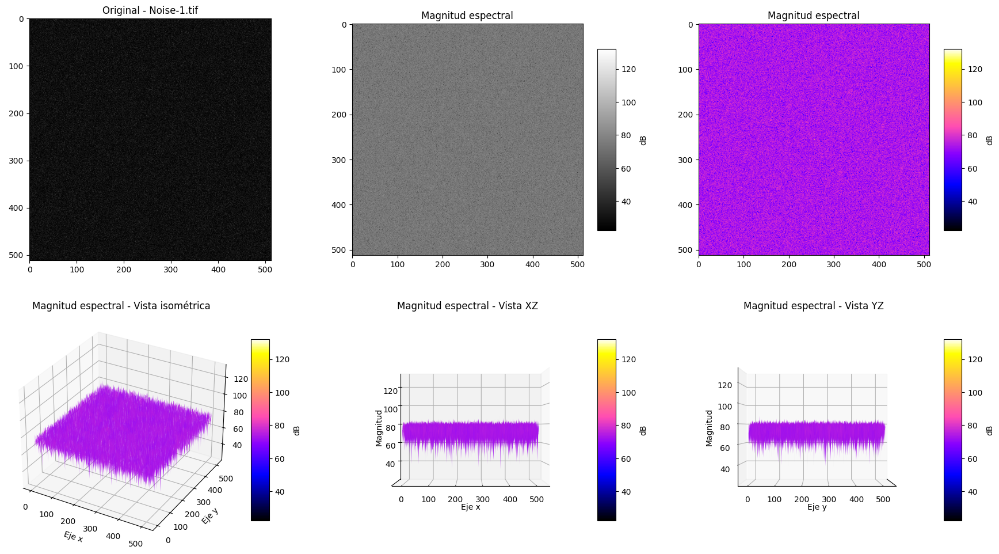

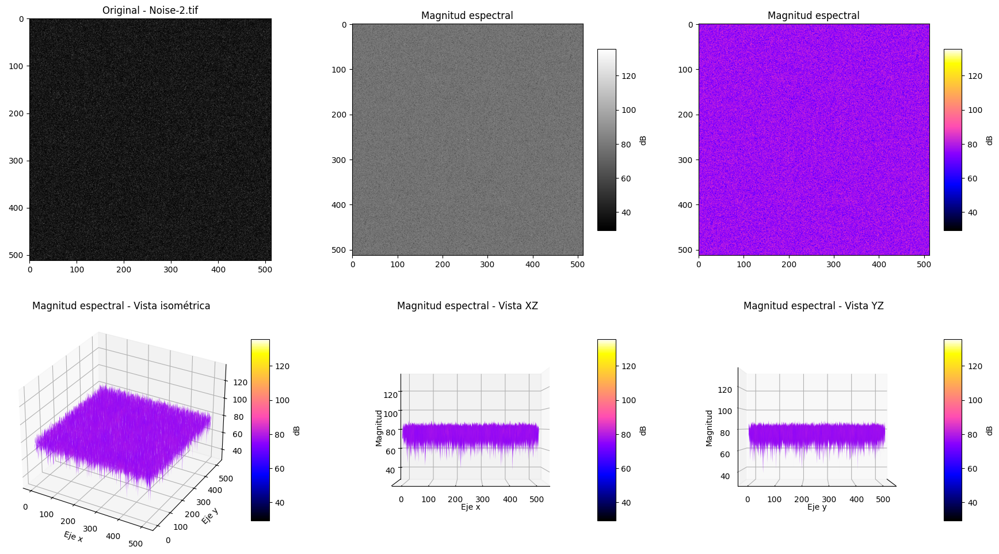

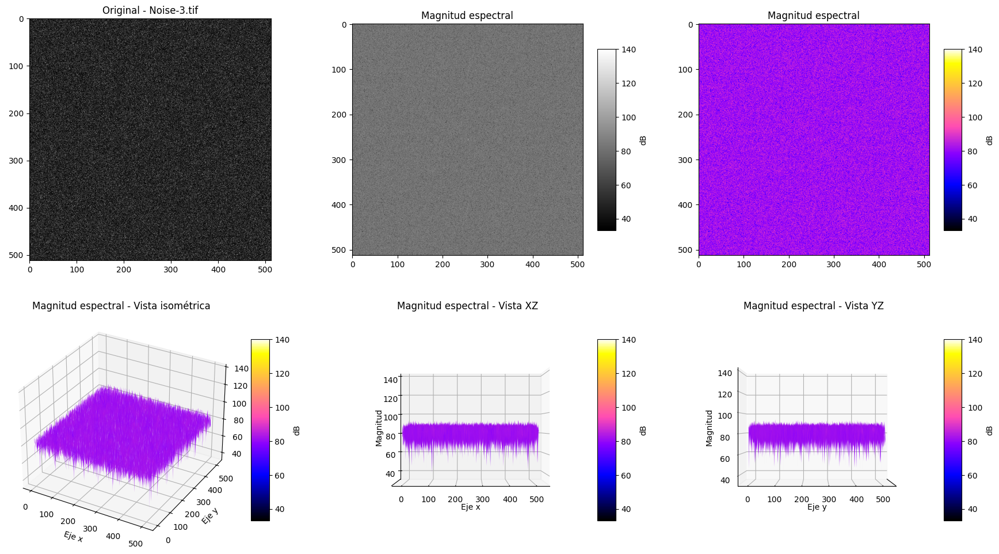

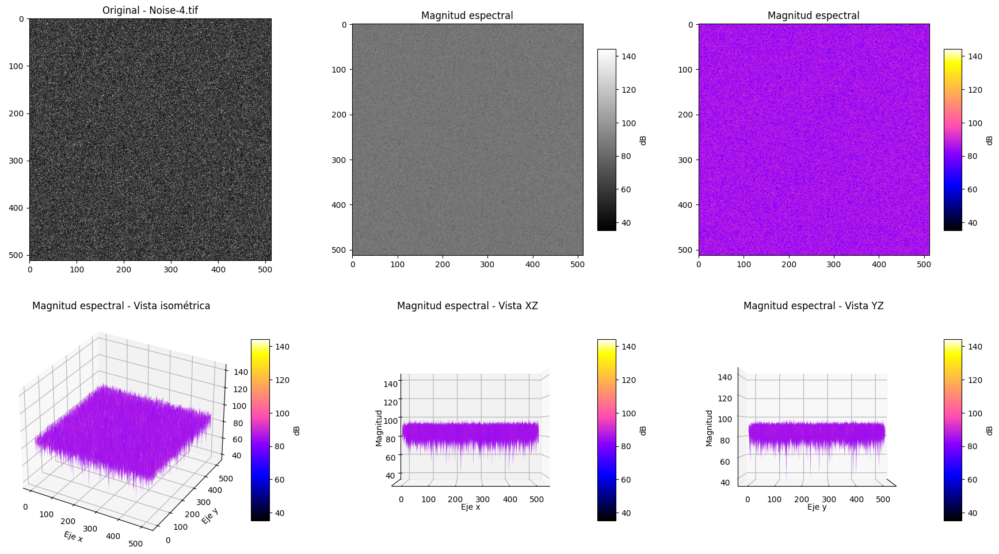

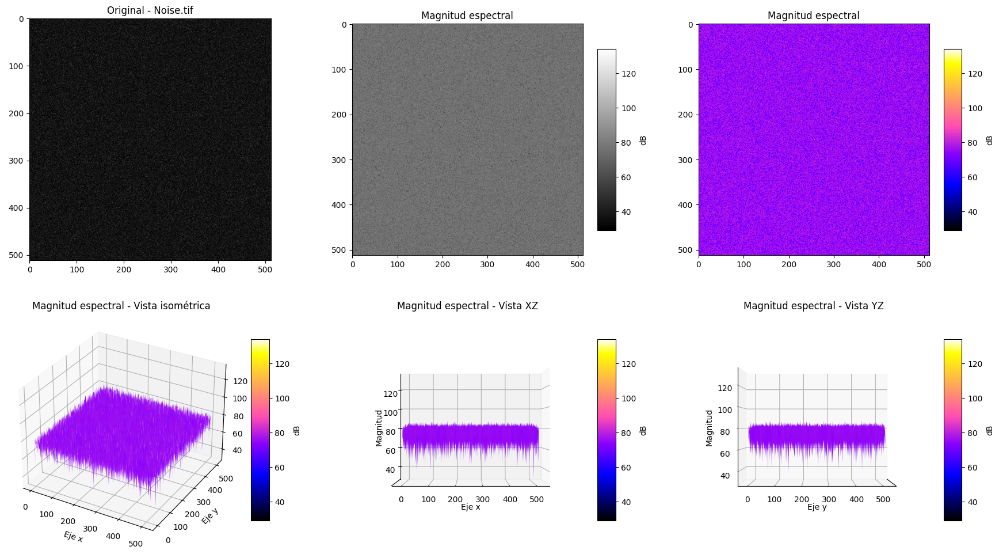

In [4]:
name_files = [*dict_folder_1.keys()]
imgs_folder_1 = getImagesFromPathfile([*dict_folder_1.values()])
spectra_dir = 'noise_estimation/fourier_estimation'

for i in range(len(imgs_folder_1)):
    fig = ffta.cr8FFTimgsPlots(imgs_folder_1[i],name_files[i])
    noise = name_files[i].split('.')[0]
    fig.savefig(os.path.join(spectra_dir, f'{noise}_fourier.png'))

# 2.I - Análisis espectral - FFT
## Imágenes pertenecientes a PAIByB-2

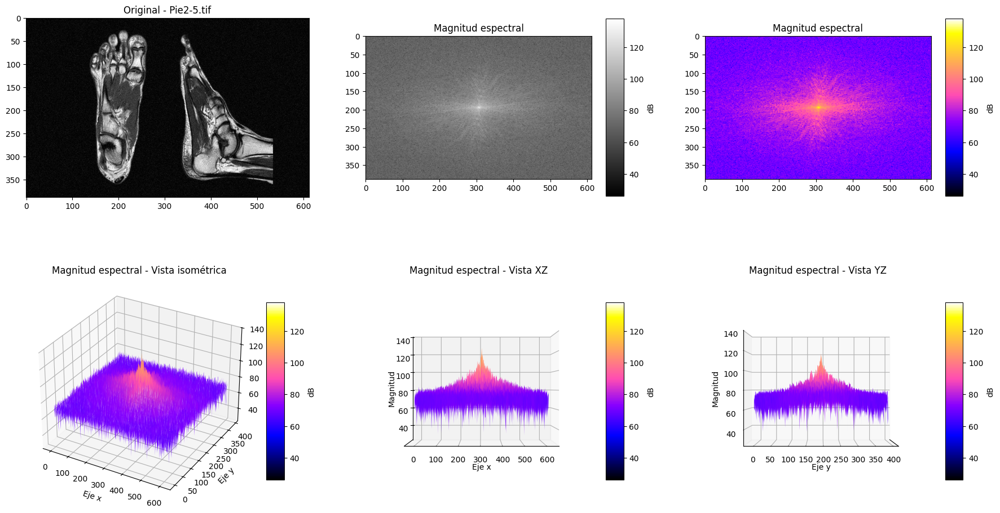

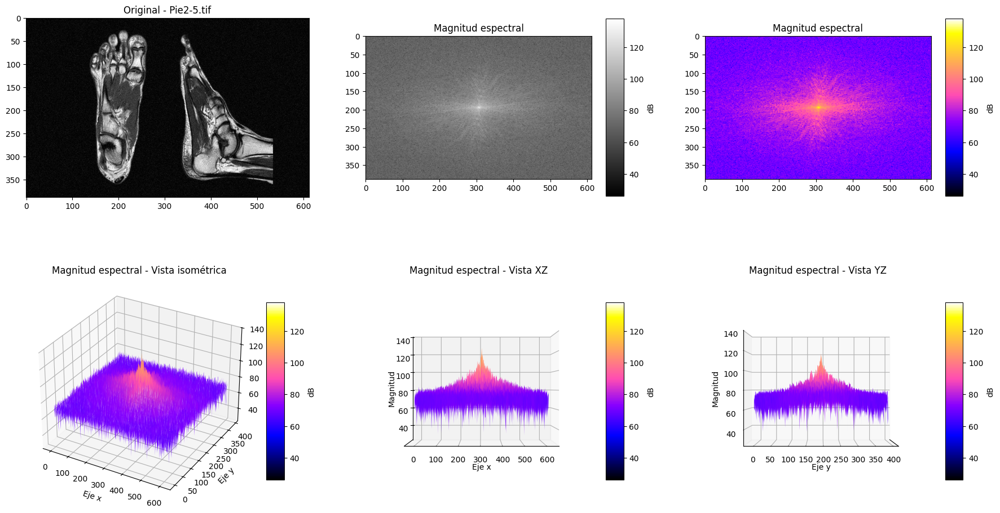

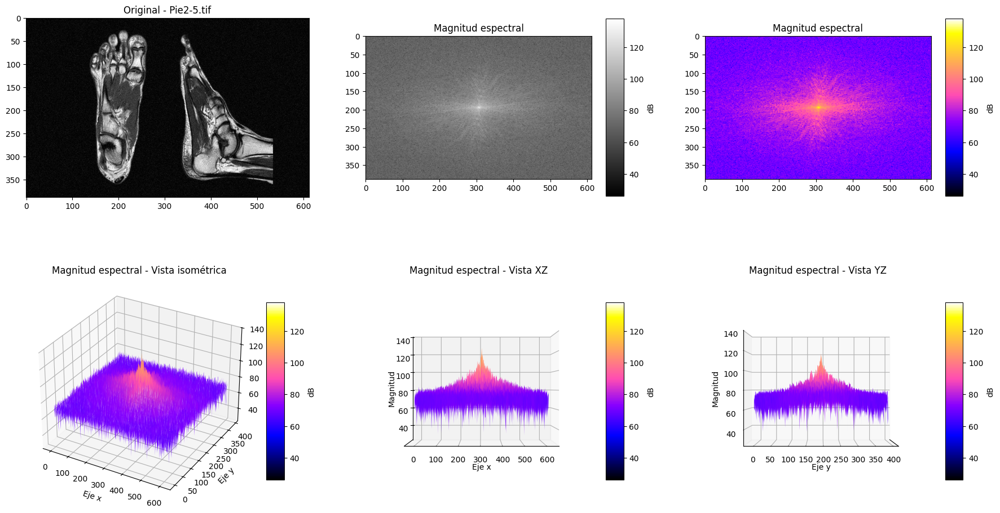

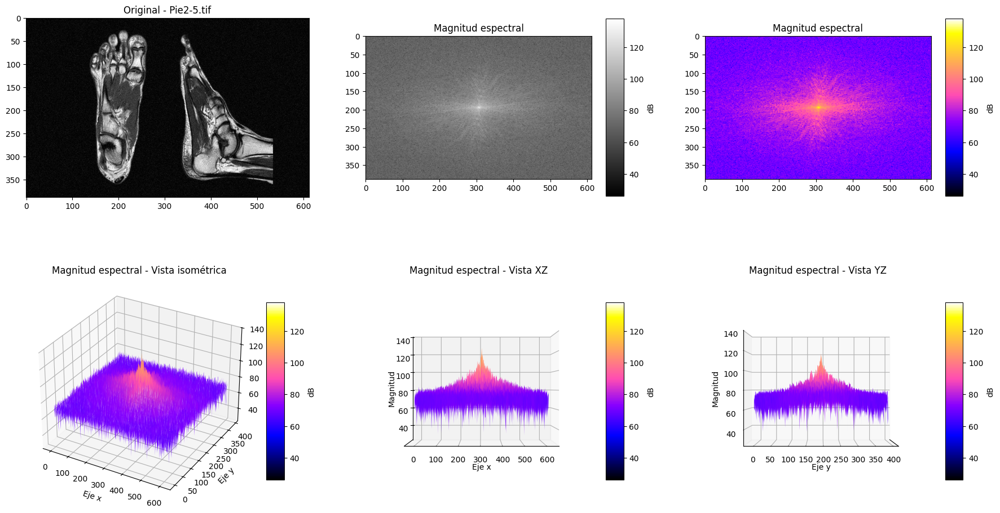

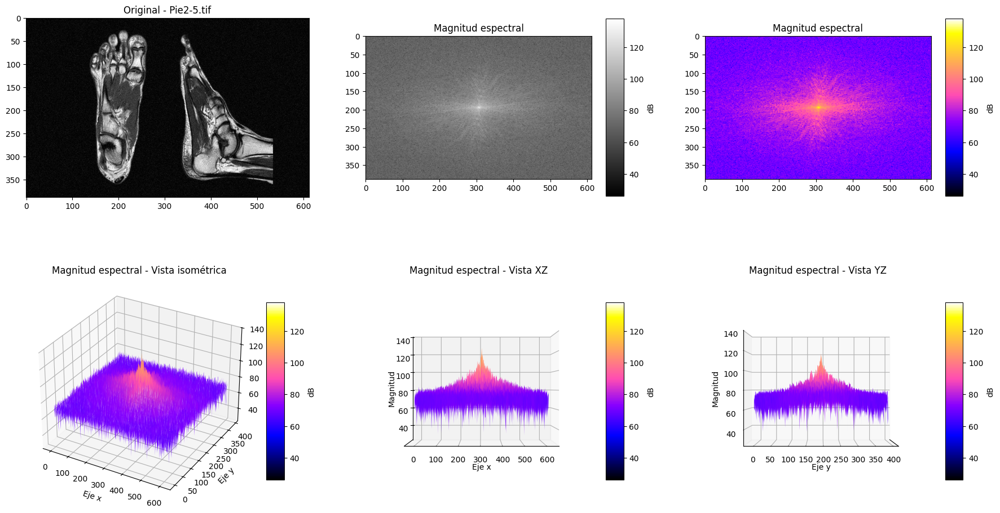

In [9]:
name_files_2 = [*dict_folder_2.keys()]
imgs_folder_2 = getImagesFromPathfile([*dict_folder_2.values()])

output_dir_noise = 'noise_estimation/fourier_estimation'

for img_folder2, fname2 in zip(imgs_folder_2, name_files_2):
    fig = ffta.cr8FFTimgsPlots(imgs_folder_2[i],name_files_2[i])
    name_raw = fname2.split('.')[0]
    fig.savefig(os.path.join(spectra_dir, f'{name_raw}_sp.png'))

# 2.I - Creación de máscaras para estimación de ruido
## Imágenes pertenecientes a PAIByB-2

In [6]:
# Selección de umbrales para crear las máscaras

ths_img_1 = [60,130]
ths_img_2 = [60,130]
ths_img_3 = [70,130]
ths_img_4 = [75,130]
ths_img_5 = [85,135]
ths_img_6 = [80,135]

ths_list = [ths_img_1,ths_img_2,ths_img_3,ths_img_4,ths_img_5,ths_img_6]

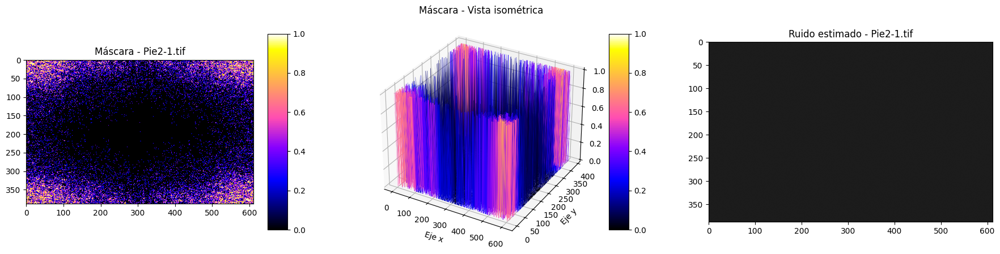

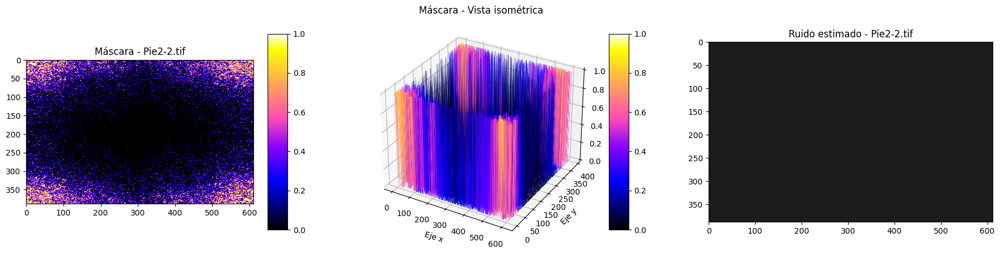

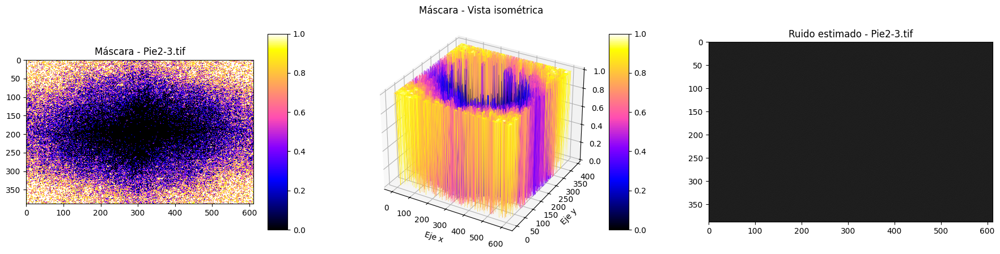

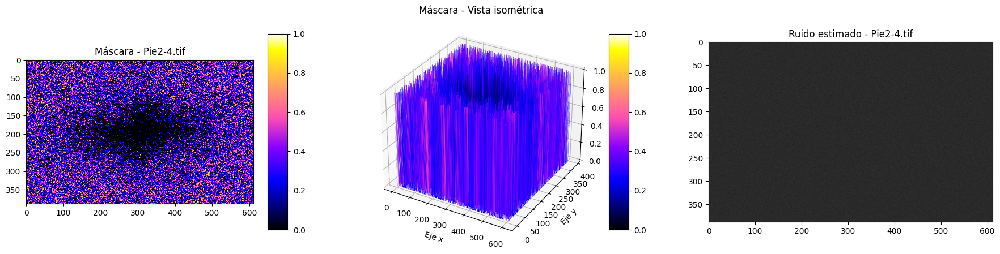

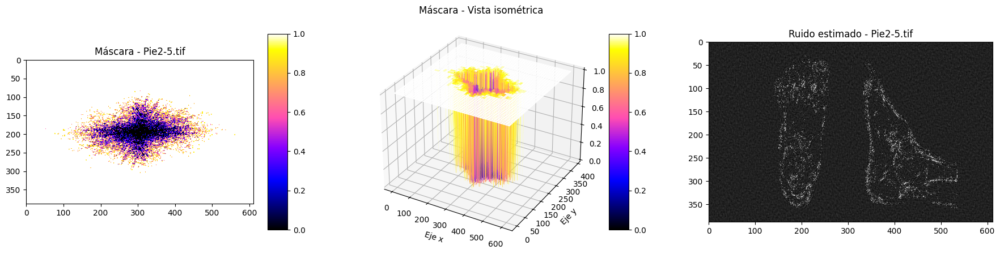

In [8]:
output_dir_noise = 'noise_estimation/fourier_estimation'
for img_folder2, ths, fname2 in zip(imgs_folder_2, ths_list, name_files_2):
    noise_estim = ffta.cr8FFTNoiseEstimPlots(img_folder2, ths, fname2)
    name_raw = fname2.split('.')[0]
    noise_estim.savefig(os.path.join(spectra_dir, f'{name_raw}_fourier.png'))

# 2.III - Denoising - Aplicación de máscaras
## Imágenes pertenecientes a PAIByB-2

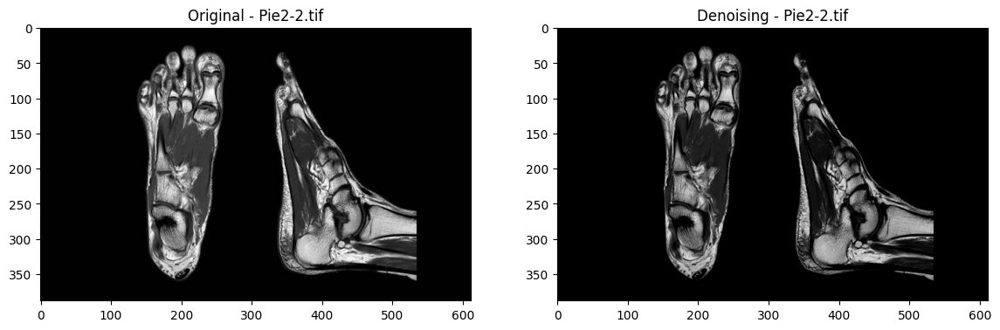

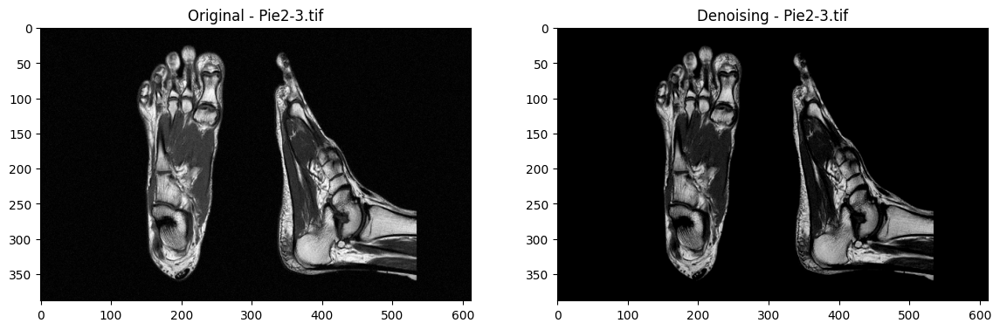

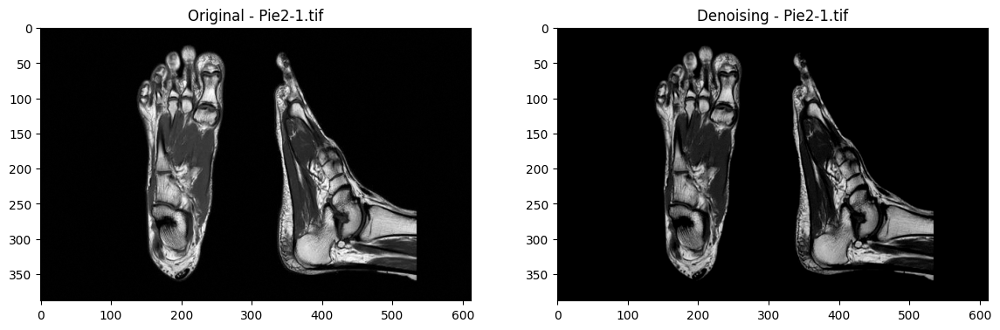

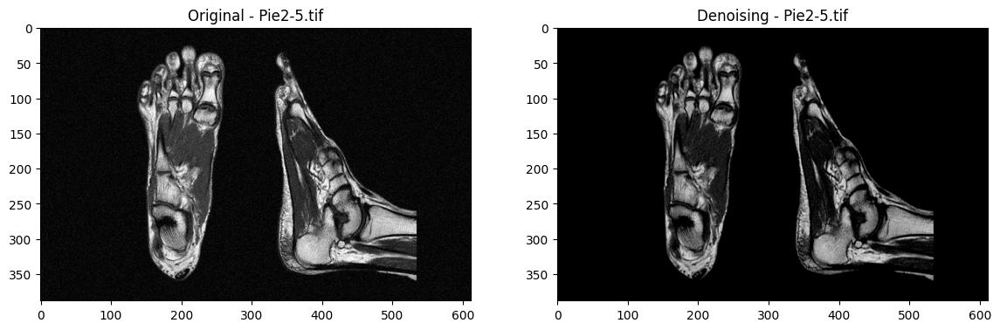

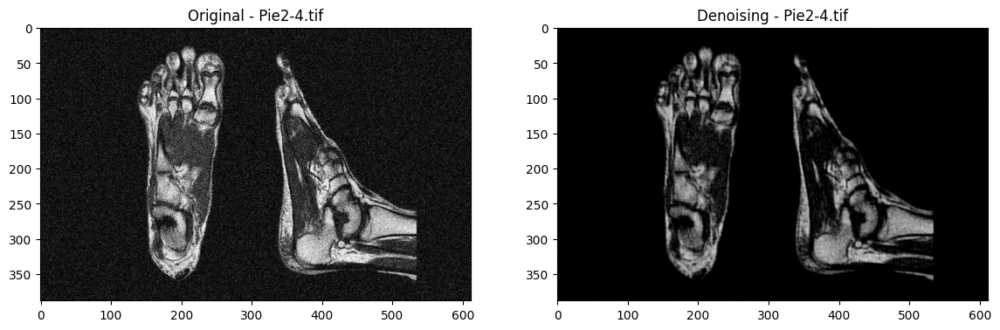

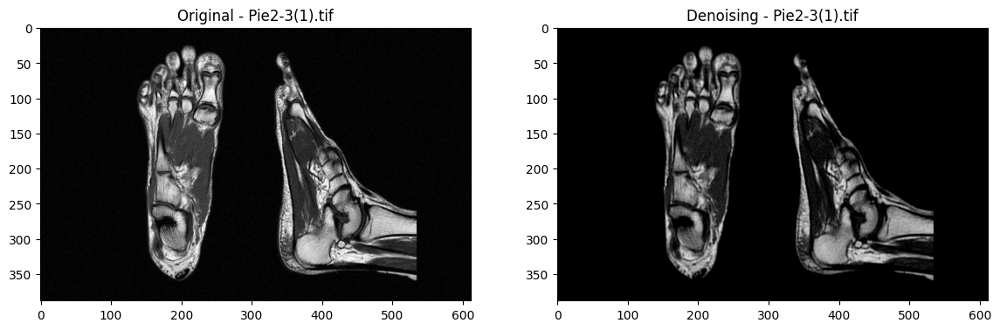

In [ ]:
output_dir_rec = 'denoised_img/fourier_denoising'
for i in range(len(ths_list)):
    rec_img = ffta.cr8FFTDenoisingPlots(imgs_folder_2[i],ths_list[i],name=name_files_2[i])
    name_raw = name_files_2[i].split('.')[0]
    cv2.imwrite(os.path.join(output_dir_rec, f"{name_raw}_fourier.png"), rec_img)